<a href="https://colab.research.google.com/github/ayushcena/Dog-Breed-Recognition/blob/main/dog_breed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Multi-class Dog Breed Classification**
This notebook builds an end-to-end multiclass image classifier using TensolFlow 2.0 and Tensorflow Hub.

### Problem
> Identifying the breed of dog given an image of a dog.

### Data
> Kaggle's Dog Breed Identification Competition
[Kaggle Dataset](https://www.kaggle.com/competitions/dog-breed-identification/data)

### Evaluation Criteria
> The evaluation is a file with prediction probabilities for each dog breed of each test image

### Features


> Some information about the data:

* We're dealing with unstructured data (images) so the best idea to use for predicting is deep learning/transfer learning.
* There are 120 breeds of dog ie. 120 different classes.
* There are 10,000+ images in training set which have labels
* There are 10,000+ images in the test set which doesn't have labels because we'll be predicting them.













In [ ]:
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

### Get our workflow ready
* Import Tensorflow 2
* Import Tensorflow Hub
* Make sure we're using GPU

In [ ]:
# Importing Tensorflow in Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availability
print("GPU", "available: YES" if tf.config.list_physical_devices("GPU") else "not available")

TF Version: 2.8.2
TF Hub Version: 0.12.0
GPU available: YES


### Getting our data ready by turning images into tensors(matrix form)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first.
Turning our images into Tensors (numerical representaion).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


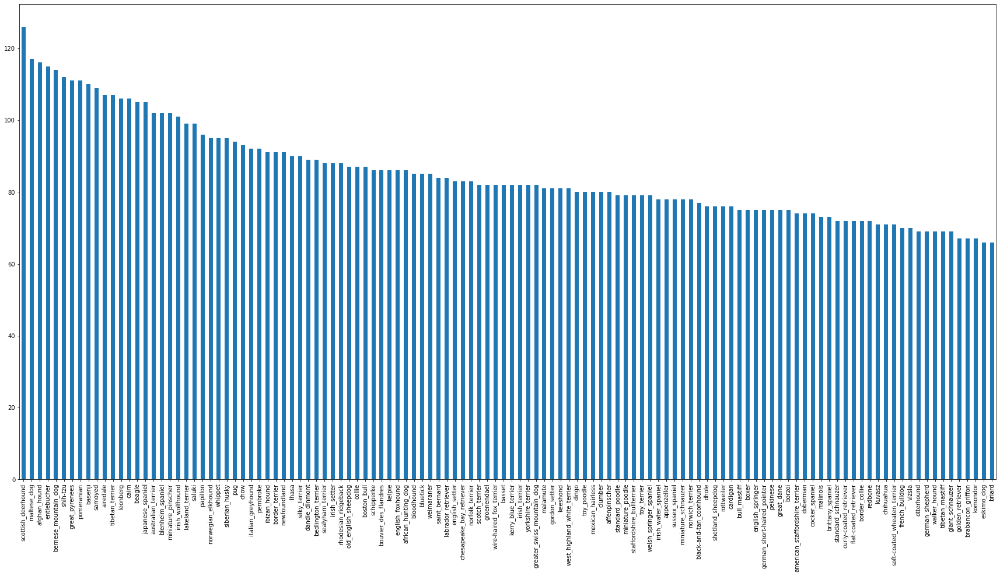

In [ ]:
# How many images per breed
labels_csv["breed"].value_counts().plot.bar(figsize=(30,15));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

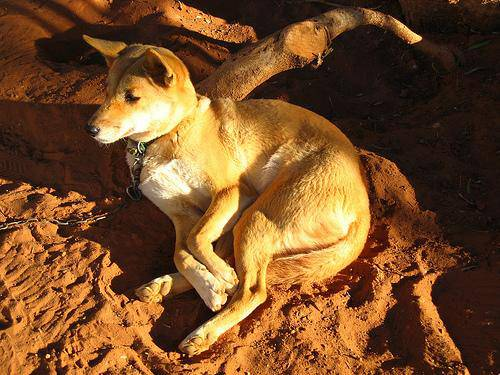

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")


### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]
# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e0c759008208229026ae7aeb04da7a75.jpg',
 'e125be9ab7aa556c82f6b33e316fb523.jpg',
 'e728ffc9ca204977f2cc3c502c68d823.jpg',
 'e17462ffe48dffec8ff70325a6047957.jpg',
 'e12b685cebb695b56fd1168dd4386582.jpg',
 'de2db91c990838b3951a72ad21988e31.jpg',
 'e917bb5669e0c273eb16304af1f69e1d.jpg',
 'e6d9085fa22d76e3c089cfaea8f39479.jpg',
 'e90868c5948296e603f26b2d2696f9c7.jpg',
 'e552addd2461f8a62e9691fa26b21370.jpg']

In [ ]:
# Check whether no of filenames matches number of actual image files
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files!


Since we've got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"] #can do labels=labels_csv["breed"].to_numpy()
labels = np.array(labels)    #for converting in array
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See is number of labels matches number of filenames
if len(filenames) == len(labels):
  print("Number of labels matches number of filenames")
else:
  print("Doesn't match")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Now turn every labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels] #this means do the single label thing for each label in labels
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(boolean_labels[5].astype(int))

[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

Note: Validation set is like a Practice exam before our final exam i.e. test set.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split data into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42) #random_state is same as doing np.random.seed on top
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

### Preprocessing Images (turning images into Tensors
To preprocess our images into Tensors, we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we have seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image 

In [ ]:
# Trying to visualize each step in above code by example one by one
# Example to read the image file
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# Example to turn the jpeg image into numerical tensor with 3 color channels (RGB)
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [ ]:
# Example to convert the above color channel values from range of 0-255 to range of 0-1
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

### Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

So that's why we do about 32 (this is batch size) images at a time (you can manually adjust the batch size if needed).

In order to use Tensorflow effectively, we need our data in the form of tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return tuple (image, label)
def get_image_label(image_path, label):
  """

  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
#  Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training databut doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y)))# labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors    
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y)))# labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X)) #buffer size is how many image dataset u want to shuffle and len X shuffles complete dataset
    # Create (image, label) tuples (this also turns the image path into preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch                                  

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize that! 

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display the image
    plt.imshow(images[i])
    # Add the image label as the ttile
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the gridlines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Because the train data is in form of a batch, we need to unbatch it to visaualize it
# We do that using next() 
# Next returns the next items of an iterator 
# Because we need to turn our batch data into iterator
# .as_numpy_iterator() returns an iterator which converts all elem of dataset to numpy 
"""
Overall the below code will take out our batch data, unwind it to turn it to
# a numpy iterator and using next, it's going to grab the first batch on top of
# this out of the first iterator and so training images will be returned first 
# and then training labels
"""
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.75934744, 0.4865971 , 0.20578209],
          [0.71168673, 0.4520714 , 0.19074835],
          [0.65982354, 0.42814675, 0.20857845],
          ...,
          [0.00784314, 0.01176471, 0.        ],
          [0.00392157, 0.00784314, 0.        ],
          [0.00392157, 0.00784314, 0.        ]],
 
         [[0.6233989 , 0.40159792, 0.16465414],
          [0.55085146, 0.34130692, 0.128495  ],
          [0.47376576, 0.29377383, 0.10911629],
          ...,
          [0.00784314, 0.01176471, 0.        ],
          [0.00392157, 0.00784314, 0.        ],
          [0.00392157, 0.00784314, 0.        ]],
 
         [[0.42769188, 0.28754377, 0.11649402],
          [0.33638197, 0.20982386, 0.05483678],
          [0.2549527 , 0.14780982, 0.02076666],
          ...,
          [0.00784314, 0.01176471, 0.        ],
          [0.00392157, 0.00784314, 0.        ],
          [0.00392157, 0.00784314, 0.        ]],
 
         ...,
 
         [[0.14509805, 0.12156864, 0.05882353],
          [0.14509

In [ ]:
len(train_images), len(train_labels)

(32, 32)

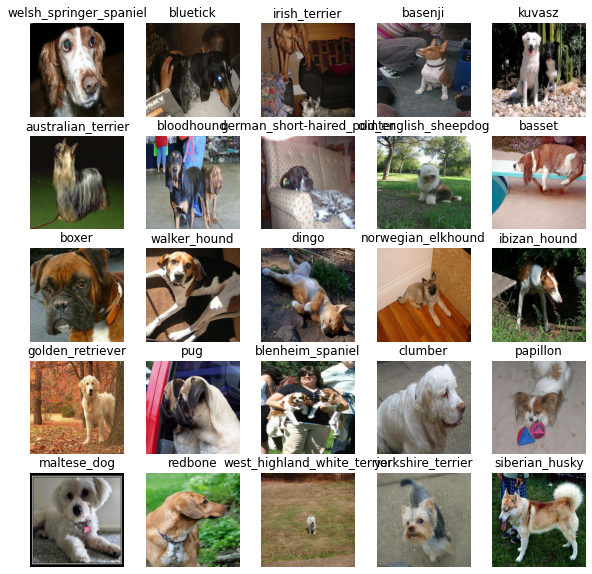

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

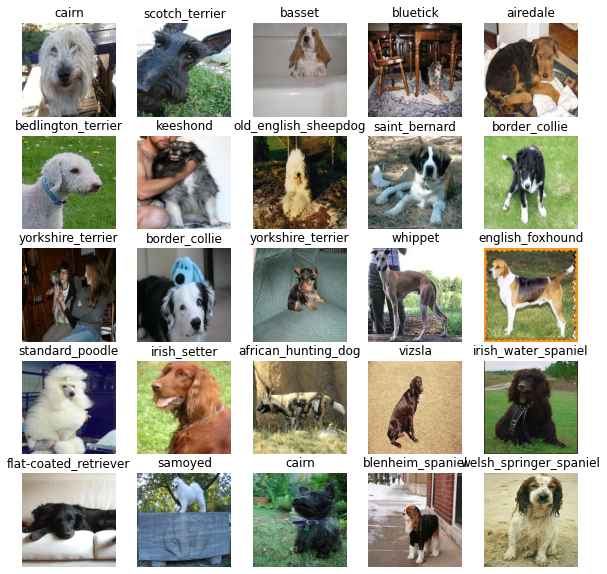

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Before we build a model, there are a few things we need to define:
* The input shape(our images shape, in the form of Tensors) to our model.
* The output shape (image, labels in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color chaannels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that). 
* Compiles the model(says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a func which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
                          # softmax is like sigmoid function but sigmoid is used
                          # in binary classification and this in multiclass classif
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # for sigmoid use BinaryCrossentropy
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track a model's progress and another for early stopping which prevents our model from training for too long.
### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a funcion to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certainevaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Monitor is value to be checked.

Patience is no of epochs with no improvement after which training is stopped.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on subset of data)
Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

Let's create a function which trains a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model(): 
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a mdoel
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 121s 3s/step - loss: 4.5850 - accuracy: 0.1013 - val_loss: 3.3883 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6462 - accuracy: 0.6913 - val_loss: 2.1168 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.5755 - accuracy: 0.9388 - val_loss: 1.6449 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2508 - accuracy: 0.9862 - val_loss: 1.4791 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 120ms/step - loss: 0.1479 - accuracy: 0.9962 - val_loss: 1.4004 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 3s 119ms/step - loss: 0.1019 - accuracy: 0.9975 - val_loss: 1.3646 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 109ms/step


array([[2.25417642e-03, 1.75298454e-04, 1.05923355e-04, ...,
        1.18061296e-04, 7.84001459e-05, 1.30701624e-03],
       [1.59122213e-03, 2.77438085e-04, 6.84579508e-03, ...,
        3.14141507e-04, 5.81048778e-04, 3.96253854e-05],
       [9.94286074e-06, 5.91777825e-05, 1.50306341e-05, ...,
        1.27455423e-04, 4.55206718e-05, 3.52104398e-04],
       ...,
       [4.02654541e-06, 1.93727592e-05, 7.70653642e-05, ...,
        8.81200322e-06, 5.18831184e-05, 2.28056597e-04],
       [1.15330750e-03, 1.27575389e-04, 1.07411779e-05, ...,
        6.45742402e-05, 1.36026047e-05, 1.73913985e-02],
       [1.70985970e-03, 3.71833921e-05, 5.46475814e-04, ...,
        1.41174661e-03, 1.99336954e-03, 4.02979203e-05]], dtype=float32)

In [ ]:
predictions.shape #200 is data inputs in val set

(200, 120)

In [ ]:
predictions[0] # this is the prob of 1st image acc to all 120 classes

array([2.25417642e-03, 1.75298454e-04, 1.05923355e-04, 2.73024983e-04,
       2.82417051e-04, 2.30055703e-05, 2.83446386e-02, 3.34702112e-04,
       1.11824666e-04, 8.51833960e-04, 1.52050270e-04, 1.52023393e-04,
       1.92839798e-04, 6.71281814e-05, 2.12186598e-04, 7.38647010e-04,
       1.68814058e-05, 3.89305562e-01, 7.81177005e-06, 2.40621273e-04,
       8.35407758e-04, 3.86973348e-04, 2.01176645e-05, 7.67283316e-04,
       2.94926158e-05, 1.02945429e-04, 7.81744197e-02, 7.15556380e-05,
       5.38274980e-05, 8.41633955e-05, 8.33776139e-05, 1.39219884e-03,
       2.56628438e-04, 4.37075978e-05, 3.07637238e-05, 1.17782012e-01,
       1.03414359e-05, 3.06662725e-04, 6.53014358e-05, 4.26676183e-04,
       1.47364254e-03, 7.59627437e-05, 8.89314833e-05, 9.54366842e-05,
       8.82456443e-05, 4.92213185e-05, 5.81995155e-05, 3.83678213e-04,
       4.27003863e-04, 6.65999323e-05, 5.81644417e-05, 2.40378831e-05,
       2.97906052e-04, 3.59548103e-05, 1.43004640e-04, 6.39714417e-05,
      

In [ ]:
len(predictions[0]) # basically 120 unique classes

120

In [ ]:
# if we sum the elements in predictions[0] then we'll get 1
# which proves it's the prob of dog being of each class and net is 1
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index=0
print(predictions[index])
print("Max value (probability of prediction):", np.max(predictions[index]))
print("Sum: ", np.sum(predictions[index]))
print("Max index: ", np.argmax(predictions[index]))
print("Predicted label: ", unique_breeds[np.argmax(predictions[index])])

[2.25417642e-03 1.75298454e-04 1.05923355e-04 2.73024983e-04
 2.82417051e-04 2.30055703e-05 2.83446386e-02 3.34702112e-04
 1.11824666e-04 8.51833960e-04 1.52050270e-04 1.52023393e-04
 1.92839798e-04 6.71281814e-05 2.12186598e-04 7.38647010e-04
 1.68814058e-05 3.89305562e-01 7.81177005e-06 2.40621273e-04
 8.35407758e-04 3.86973348e-04 2.01176645e-05 7.67283316e-04
 2.94926158e-05 1.02945429e-04 7.81744197e-02 7.15556380e-05
 5.38274980e-05 8.41633955e-05 8.33776139e-05 1.39219884e-03
 2.56628438e-04 4.37075978e-05 3.07637238e-05 1.17782012e-01
 1.03414359e-05 3.06662725e-04 6.53014358e-05 4.26676183e-04
 1.47364254e-03 7.59627437e-05 8.89314833e-05 9.54366842e-05
 8.82456443e-05 4.92213185e-05 5.81995155e-05 3.83678213e-04
 4.27003863e-04 6.65999323e-05 5.81644417e-05 2.40378831e-05
 2.97906052e-04 3.59548103e-05 1.43004640e-04 6.39714417e-05
 3.19956482e-04 9.96964285e-04 1.27769611e-03 8.89859274e-02
 9.94243965e-05 1.36638764e-05 1.05203339e-03 4.37409981e-05
 2.99919047e-04 2.854754

In [ ]:
# to check the same index in unique breeds array, we'll get cairn itself
unique_breeds[26]

'cairn'

Having the above functionality is great but we want to be able to do it at scale.

And its would be even better if we could see the image of which the predictions is being made on!

**Note:** Prediction probabilities also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) tensors and returns
  separate arrays of images and labels.
  """
  images= []
  labels= []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabs, an array of truth labels and an array of images and an integers.
* Covert the prediction probabs to a predicted label.
* Plot the predicted label, its predicted probab, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image of sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100, 
                                    true_label),
                                    color=color)

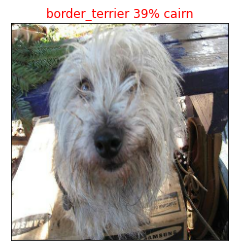

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, 
          n=0)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer 
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes 
  * Prediction probabilities values
  * Prediciton labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for smaple n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

# Explanation of below codes in next code sections..GO DOWN

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] 

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
# BELOW 4 SECTIONS OF CODE IS EXPLANATION OF ABOVE FUNC CODES
# SO USE OF FUNCTION IS AFTER 4 CODE SECTIONS
predictions[0]

array([2.25417642e-03, 1.75298454e-04, 1.05923355e-04, 2.73024983e-04,
       2.82417051e-04, 2.30055703e-05, 2.83446386e-02, 3.34702112e-04,
       1.11824666e-04, 8.51833960e-04, 1.52050270e-04, 1.52023393e-04,
       1.92839798e-04, 6.71281814e-05, 2.12186598e-04, 7.38647010e-04,
       1.68814058e-05, 3.89305562e-01, 7.81177005e-06, 2.40621273e-04,
       8.35407758e-04, 3.86973348e-04, 2.01176645e-05, 7.67283316e-04,
       2.94926158e-05, 1.02945429e-04, 7.81744197e-02, 7.15556380e-05,
       5.38274980e-05, 8.41633955e-05, 8.33776139e-05, 1.39219884e-03,
       2.56628438e-04, 4.37075978e-05, 3.07637238e-05, 1.17782012e-01,
       1.03414359e-05, 3.06662725e-04, 6.53014358e-05, 4.26676183e-04,
       1.47364254e-03, 7.59627437e-05, 8.89314833e-05, 9.54366842e-05,
       8.82456443e-05, 4.92213185e-05, 5.81995155e-05, 3.83678213e-04,
       4.27003863e-04, 6.65999323e-05, 5.81644417e-05, 2.40378831e-05,
       2.97906052e-04, 3.59548103e-05, 1.43004640e-04, 6.39714417e-05,
      

In [ ]:
predictions[0].argsort()
# It is basically the sorted probability of particular indexes in predictions[0]
# The first no is the index in predictions[0] with least probab and last is highest

array([ 92,  18,  84,  36,  61, 108,  16,  99,  22,   5,  51,  24,  34,
       101,  91,  53, 115, 113,  33,  63, 112,  45,  28, 107,  50,  46,
        55,  38,  49,  13,  27,  41,  86, 118,  75,  30,  29,  44,  42,
        43,  60,  25,  67,  94,   2, 111,  82,   8, 117,  72,  54,  11,
        10,  80,  96,   1,  12,  14,  66,  19,  32,   3,  98,   4,  78,
        52,  64,  37,  56,   7,  47,  21, 114,  95,  71,  39,  48, 105,
       110,  69,  88,  87,  89,  74,  85,  15,  23, 104,  20,   9,  57,
        62,  58, 119,  31,  40,   0,  93,  81,  68,  90, 106, 116,  97,
        79,  83,  76,  77, 103, 100, 109,  70,   6,  65,  73, 102,  26,
        59,  35,  17])

In [ ]:
# Now we want top 10 pred indexes so we'll slice the top 10 predictions and then reverse it in array
# As we know last 10 nos in predictions[0] are indexes of highest probabs
# So we slice the last 10 in the array and reverse it
predictions[0].argsort()[-10:][::-1]

array([ 17,  35,  59,  26, 102,  73,  65,   6,  70, 109])

In [ ]:
# To get the top 10 pred values of predictions[0]
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.38930556, 0.11778201, 0.08898593, 0.07817442, 0.0480285 ,
       0.0334251 , 0.02854754, 0.02834464, 0.02013195, 0.01963175],
      dtype=float32)

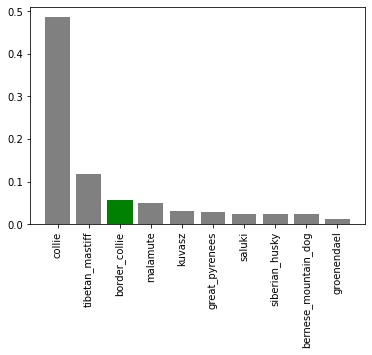

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to visualize our predictions and evaluate our model, let's check out a few.

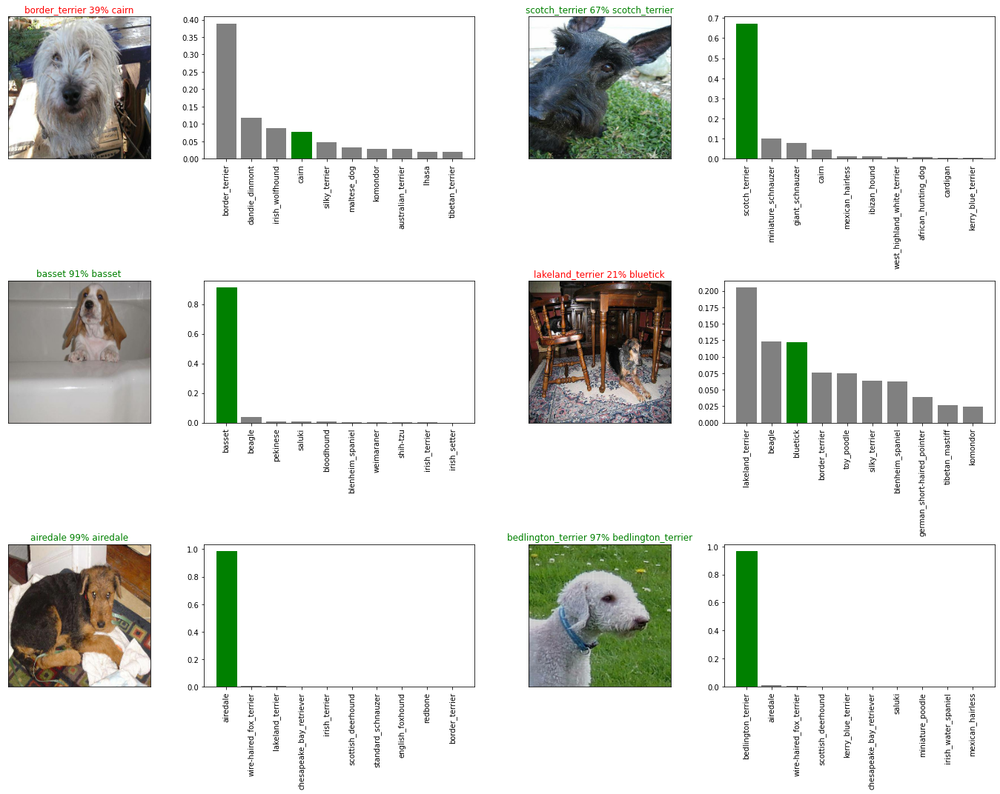

In [ ]:
# Let's checkout a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout()

plt.show()

### Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path
  

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220613-16581655139490-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220613-16581655139490-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20220613-10491655117360-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20220613-10491655117360-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.2398 - accuracy: 0.6800


[1.239823818206787, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.2784 - accuracy: 0.7050


[1.2783695459365845, 0.7049999833106995]

## Training a big dog model on FULL DATASET

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe upto 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 114ms/step - loss: 1.3291 - accuracy: 0.6688
Epoch 2/100
320/320 [==============================] - 38s 118ms/step - loss: 0.3992 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 37s 117ms/step - loss: 0.2349 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 36s 113ms/step - loss: 0.1555 - accuracy: 0.9618
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1053 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0777 - accuracy: 0.9852
Epoch 7/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0591 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0450 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 39s 120ms/step - loss: 0.0366 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 39s 122m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20220613-17111655140287-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20220613-17111655140287-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20220613-11221655119342-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20220613-11221655119342-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset
Since our model has been trained on the images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e07e608afaa89ee4ee939ad0a3bd3224.jpg',
 'drive/MyDrive/Dog Vision/test/e0e3eb01e80b1d694a47b23909e158ec.jpg',
 'drive/MyDrive/Dog Vision/test/e7041fdc87517192097e62b3822309b7.jpg',
 'drive/MyDrive/Dog Vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Dog Vision/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 'drive/MyDrive/Dog Vision/test/e5f207e00213cc76be3ae9219a2e49cb.jpg',
 'drive/MyDrive/Dog Vision/test/e55534e27f92b4c8177ed2beb1cbba7b.jpg',
 'drive/MyDrive/Dog Vision/test/dcddc9135d0a138bb83a55bbc06adacc.jpg',
 'drive/MyDrive/Dog Vision/test/e520e4cd7608c47cd9017bb87e88f334.jpg',
 'drive/MyDrive/Dog Vision/test/e53cb5b42ea1a7700cd294a336890361.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about 1 hr)

In [ ]:
# Mkae predictions on test data bacth using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 152s 457ms/step


In [ ]:
# Save predictions (Numpy array) to csv file to access later
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.13176818e-12, 6.15290041e-11, 9.11172288e-13, ...,
        3.25623144e-12, 3.54572518e-13, 3.70368672e-18],
       [3.45660656e-09, 8.97607060e-06, 6.91492752e-10, ...,
        3.65728170e-07, 4.36220504e-10, 1.58600066e-09],
       [5.14516323e-08, 1.04014919e-06, 3.66427557e-05, ...,
        3.17167381e-09, 9.14234235e-08, 3.24679977e-10],
       ...,
       [2.11389284e-09, 1.97043909e-10, 2.05651902e-11, ...,
        9.10686023e-13, 1.39930123e-10, 9.45090228e-10],
       [4.61279362e-01, 1.72696613e-08, 2.18847518e-09, ...,
        4.23219126e-10, 1.84691282e-06, 1.40004195e-05],
       [1.76462404e-11, 3.02890547e-12, 4.54927866e-11, ...,
        4.55090667e-05, 4.96715870e-07, 2.06771400e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our model prediction probability outputs in a Dataframe with an ID column and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas Dataframe with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID'S from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the Dataframe as a csv to submit it to Kaggle.

In [ ]:
list(unique_breeds)[:5]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier']

In [ ]:
["id"] + list(unique_breeds)[:5]

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier']

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[:5]
# We need to use the id from here

['drive/MyDrive/Dog Vision/test/e07e608afaa89ee4ee939ad0a3bd3224.jpg',
 'drive/MyDrive/Dog Vision/test/e0e3eb01e80b1d694a47b23909e158ec.jpg',
 'drive/MyDrive/Dog Vision/test/e7041fdc87517192097e62b3822309b7.jpg',
 'drive/MyDrive/Dog Vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/MyDrive/Dog Vision/test/dd1eddb779b2611cdd42de48ae623a62.jpg']

In [ ]:
test_path

'drive/MyDrive/Dog Vision/test/'

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
test_ids[:5]
# We can see we are getting id + .jpg which we dont want. So we'll add [0] at end

[('e07e608afaa89ee4ee939ad0a3bd3224', '.jpg'),
 ('e0e3eb01e80b1d694a47b23909e158ec', '.jpg'),
 ('e7041fdc87517192097e62b3822309b7', '.jpg'),
 ('e1967a2e9c507c256b83a1e2e4f4e941', '.jpg'),
 ('dd1eddb779b2611cdd42de48ae623a62', '.jpg')]

In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:5]

['e07e608afaa89ee4ee939ad0a3bd3224',
 'e0e3eb01e80b1d694a47b23909e158ec',
 'e7041fdc87517192097e62b3822309b7',
 'e1967a2e9c507c256b83a1e2e4f4e941',
 'dd1eddb779b2611cdd42de48ae623a62']

In [ ]:
# Now we'll add the ids to preds_df dataframe
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e07e608afaa89ee4ee939ad0a3bd3224,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e0e3eb01e80b1d694a47b23909e158ec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7041fdc87517192097e62b3822309b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1967a2e9c507c256b83a1e2e4f4e941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dd1eddb779b2611cdd42de48ae623a62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
test_predictions[0]

array([1.13176818e-12, 6.15290041e-11, 9.11172288e-13, 1.24398191e-11,
       1.41298784e-07, 1.85944649e-09, 1.60410053e-11, 1.96906510e-12,
       6.29928922e-12, 1.64778738e-12, 1.13191991e-11, 1.24370325e-09,
       1.79098747e-09, 1.26004977e-07, 2.33231628e-10, 3.91433088e-13,
       8.93983815e-06, 6.14459113e-13, 5.55025508e-07, 1.33196254e-12,
       2.73178230e-10, 1.08229499e-13, 4.53889144e-14, 1.75517684e-10,
       2.45032383e-10, 2.44487697e-09, 3.36907303e-12, 4.56274662e-09,
       1.44981671e-08, 1.87843176e-13, 4.34938447e-05, 6.34086339e-09,
       1.19092041e-12, 2.14665796e-08, 6.93920073e-13, 4.34136668e-12,
       7.00557841e-12, 1.18549311e-11, 5.60212727e-12, 2.30796701e-11,
       1.02647618e-06, 2.17333262e-09, 2.58340958e-08, 1.15978760e-09,
       2.06726696e-07, 1.35317018e-12, 1.53819375e-08, 1.35900857e-15,
       1.01430528e-12, 4.62301483e-04, 1.40416270e-12, 5.54301605e-10,
       9.74412501e-01, 7.74303999e-09, 1.98505873e-07, 1.56969958e-11,
      

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e07e608afaa89ee4ee939ad0a3bd3224,1.131768e-12,6.152900e-11,9.111723e-13,1.243982e-11,1.412988e-07,1.859446e-09,1.604101e-11,1.969065e-12,6.299289e-12,...,1.780723e-14,1.516488e-12,2.126090e-14,2.413711e-05,2.260732e-09,1.036906e-12,2.212156e-09,3.256231e-12,3.545725e-13,3.703687e-18
1,e0e3eb01e80b1d694a47b23909e158ec,3.456607e-09,8.976071e-06,6.914928e-10,5.523878e-11,2.706057e-09,5.463415e-09,2.908402e-09,1.450989e-09,1.845278e-10,...,9.537396e-08,1.153443e-09,2.507107e-10,1.564203e-08,1.942203e-07,1.966140e-10,1.351957e-10,3.657282e-07,4.362205e-10,1.586001e-09
2,e7041fdc87517192097e62b3822309b7,5.145163e-08,1.040149e-06,3.664276e-05,1.113889e-09,2.627062e-10,3.966179e-08,1.387913e-06,2.993696e-09,8.868256e-10,...,1.714661e-10,5.856464e-10,3.092922e-10,5.943323e-07,1.749223e-07,3.106519e-11,2.820031e-07,3.171674e-09,9.142342e-08,3.246800e-10
3,e1967a2e9c507c256b83a1e2e4f4e941,1.772974e-09,2.333560e-12,2.286856e-10,9.243723e-10,5.343519e-06,3.371174e-09,9.654168e-11,4.054906e-11,1.388052e-07,...,2.987908e-09,1.760337e-10,9.925249e-01,6.787597e-07,3.497944e-06,1.791764e-11,8.193925e-13,2.645866e-07,3.449465e-10,2.358881e-11
4,dd1eddb779b2611cdd42de48ae623a62,3.289649e-11,3.555659e-13,1.191602e-12,2.569870e-15,3.894827e-12,8.147582e-15,9.691738e-09,2.291386e-11,1.064648e-16,...,6.631611e-11,7.697727e-13,2.101281e-13,9.580044e-14,3.574345e-13,1.768151e-16,1.883853e-13,2.276014e-15,1.583011e-13,1.127400e-10


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_preds_submission.csv",
                index=False)

### Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepath of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images. 

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/custom-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/custom-dog-photos/labrador_dog_family.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/boxer_dog_pet.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/samoyed_dog_canine.jpg',
 'drive/MyDrive/Dog Vision/custom-dog-photos/australian_terrier_dog_terrier.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data


Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

array([[2.45143295e-10, 3.34885897e-10, 4.72297201e-10, 9.25411747e-10,
        8.30252946e-04, 6.06092732e-09, 1.60001221e-08, 7.31225853e-08,
        2.27879471e-09, 3.14374891e-04, 4.27074809e-07, 2.61899460e-11,
        2.12297368e-06, 8.12062917e-10, 3.40215713e-08, 2.92761597e-05,
        1.60866691e-07, 5.01048554e-08, 5.53975532e-09, 8.81025830e-09,
        2.24989716e-09, 4.40185602e-07, 1.87228171e-08, 7.31575600e-09,
        4.74677194e-07, 7.00587680e-06, 2.19931007e-08, 3.68349212e-10,
        6.07070979e-05, 3.04933508e-07, 3.17981410e-08, 2.29011921e-09,
        3.50398722e-07, 4.90243135e-09, 1.88033417e-04, 3.28397709e-06,
        7.07178871e-10, 2.43474642e-06, 5.07015443e-07, 4.28861449e-06,
        6.05891037e-05, 3.28872618e-09, 3.89290932e-07, 2.07959092e-05,
        7.56188911e-07, 2.67266653e-08, 1.61108659e-07, 2.67716928e-06,
        1.25937646e-07, 3.90689347e-05, 7.38884935e-08, 3.79312269e-06,
        3.60263162e-04, 9.26997359e-08, 2.29868791e-09, 2.149683

In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'boxer', 'samoyed', 'australian_terrier']

In [ ]:
# Get custom images (our unbatchify() func won't work as there aren't labels.. maybe we can fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

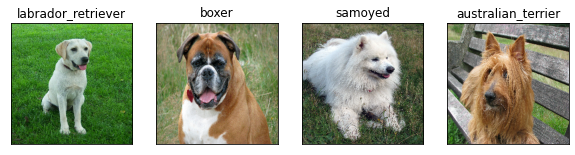

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)